## Integrantes
- Alarcón Rodríguez Luis Guillermo
- Chávez Salgado Carlos Daniel
- Rodríguez Salas Carlos Oswaldo

# Tarea 3: Gráficas e Imágenes

ESta tarea consiste de una serie de problemas donde (i) Visualizarás los resultados que obtengas con un programa (usando gráficas o imágenes), (ii) animarás una serie de objetos, (iii) Extraerás información de alguna imágen. 

Para esto utilizarás varias de las cosas que ya hiciste en tareas pasadas, así que será necesario que junto con el notebook de la tarea incluyas un archivo .jl que contenga las funciones de las primeras tareas que vayas a usar en esta. Asegúrate que tus funciones corren adecuadamente. Si no tienes certeza de alguna de ellas, pregunta a tus compañeros. Para incluir el archivo en el notebook de esta tarea agrega la primera celda: 

include("nombre_del_archivo.jl")

Las funciones de ese archivo NO las revisaré, así que **no incluyas en él ninguna función que quieras que se califique**. 

In [1]:
# include("nombre_del_archivo.jl")

Nota: Con esta tarea termia la introducción a Julia. Si logras hacer la tarea, significa que ya sabes programar bien, el resto del curso será conocer diferentes algoritmos y paqueterías para resolver problemas a los que se enfrenta frecuentemente un físico. Suerte en la tarea.



## Gráficas y animaciones

[1] **(talachudo)**  Ley de Zipf. Para este ejercicio primero necesitas revisar cómo abrir un archivo txt y leerlo (para evitar copiar a mano un texto). Para esto usa el archivo "aleph.txt" que viene junto con esta tarea y prueba lo siguiente: 

archivo = open("aleph.txt")
texto = read(archivo, String)
close(archivo)

La primera parte abre el archivo, la segunda linea lee el archvio y pone el texto en la variable *texto* y la última linea cierra el archivo (para que se pueda usar en algo más. 


In [2]:
archivo = open("aleph.txt")
texto = read(archivo, String)
close(archivo)

La tarea consiste en contar cuantas veces aparece cada palabra (usando las funciones que hiciste en la tarea pasada) y con ello hacer un histograma de ese conteo que esté ordenado por la frecuencia con la que aparecen las palabras, es decir, la primera palabra es la que más veces se repite y la última palabra es la que menos veces aparece en el texto. 

La gráfica hazla en escala logarítimca tanto en el eje x, como en el eje y. Pon además etiquetas a los ejes, el eje x "palabras", el eje y el LaTeX "P". 

Además agrega a este histograma una ley de potencia (una curva de la forma $y(x) = a x^\lambda$) que aproxime como decae el histograma. Agrega en este caso la etiqueta $y(x) = a x^\lambda$ a esta curva (sin que haya una etiqueta para el histograma). 

In [1]:
function frecuencia(g)
    a=split(g, " ")
    l=[]
    h=[]
    u=unique(a)
    for n ∈ 1:length(u)
         d=0
        for i ∈ 1:length(a)
        if u[n]==a[i]
            d+=1
            end
        end
    push!(h, d)
    end
    append!(l, [u[i], h[i]] for i ∈ 1:length(u))
    y=sort!(l, by = x -> x[2], rev=true)
    return y
end

using Plots
using Statistics
using LaTeXStrings

y=[frecuencia(texto)[i][2] for i ∈ 1:length(frecuencia(texto))]
valores=[(log(y[i])-log(267))/log(i) for i ∈ 2:length(y)]
λ=mean(valores)


plot(y,yaxis=:log,xaxis=:log,ylim=(1,260),xlim=(1,10^3),xlabel="Palabras",ylabel=L"P",label="")
plot!(x-> 267*(x^λ),label=L"y(x)=267^{%$λ}")



LoadError: UndefVarError: texto not defined

[2] **(fácil)** Diagramas de Conweb: Estos diagramas consisten de el mapeo $f$ (función) que se va a estudiar, la recta identidad, el segmento $(x_0,0), (x_0,f(x_0))$, y de los segmentos de la forma $(x_i, x_{i+1}), (x_{i+1},x_{i+1})$ y los segmentos de la forma $(x_{i+1},x_{i+1}), (x_{i+1},x_{i+2})$. Haz una función que dado un mapeo $f(x)$, un valor inicial $x_0$ y un de aplicaciones del mapeo regrese el diagrama de Conweb correspondiente. Pruébalo con el mapeo logístico para el caso donde hay un punto atractivo (que corresponde a la intersección de la parábola y la recta identidad), comenzando desde $x_0 = 0.3$. Pruébalo también para el caso donde haya 2 valores que sean cíclicos (o sea que $f(f(x_c)) = x_c$, pero $f(x_c)  \ne x_c$ ). 

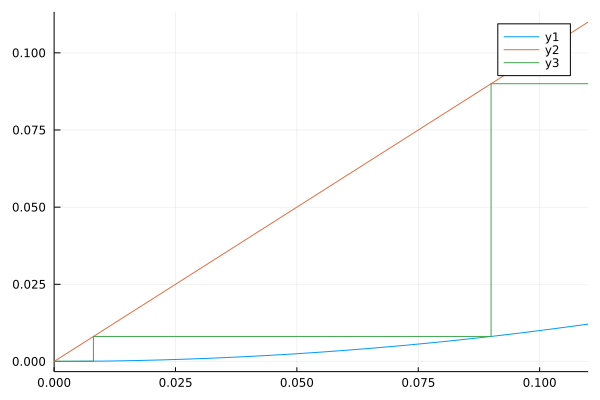

In [4]:

function conweb(f,x0,n;limx=(0,0.11),limy=(0,0.31))
    puntox=[]
    puntoy=[]
    plot(f,xlim=limx,limy=(0,1))
    plot!(x->x)
    insert!(puntox,1,x0)
    insert!(puntoy,1,0)
    insert!(puntox,2,x0)
    insert!(puntoy,2,f(x0))
    for i ∈ 1:n
        if mod(i,2)==1
            insert!(puntox,i+2,puntoy[i+1])
            insert!(puntoy,i+2,puntoy[i+1])
        elseif mod(i,2)==0
            insert!(puntox,i+2,puntox[i+1])
            insert!(puntoy,i+2,f(puntox[i+1][1]))
        end

    end
    plot!(puntox,puntoy)

end


conweb(x->x^2,0.3,10)


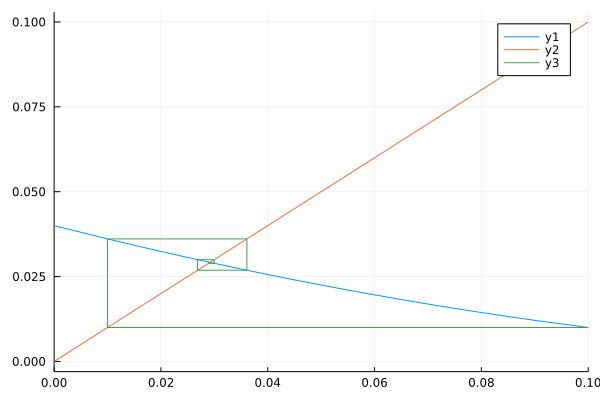

In [5]:
conweb(x->(x-0.2)^2,0.3,10,limx=(0,0.1),limy=(0,0.1))

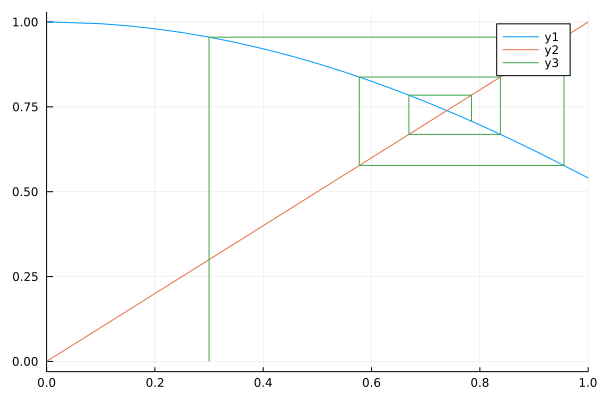

In [6]:
conweb(cos,0.3,10,limx=(0,1),limy=(0,1))

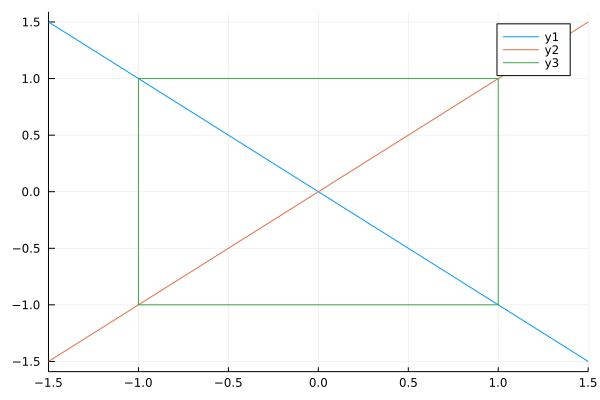

In [7]:
conweb(x->(-x),1,10,limx=(-1.5,1.5),limy=(-1.5,1.5))

[3]**(fácil)** Utiliza tus funciones para calcular el tiempo que tarda en colisionar un tiro parabólico con una recta de la forma $y(x) = constante$ para hacer una función que grafique la recta y la parábola. Si el tiro parabólico inicia en $x_i$ y termina en $x_f$, la recta debe ir desde $x_i-\Delta$ hasta $x_f+\Delta$ con $\Delta = \frac{x_f-x_i}{10}$ y la parábola debe de ir desde $x_i$ hasta $x_f$. Finalmente utiliza esta función graficar y animar sobre esas gráficas unos 10 a 20 diferentes ángulos de tiro (simultaneos). Asegúrate de que la animación mantenga la proporción, es decir, que una unidad en la dirección $y$ mida en la gráfica lo mismo que una unidad en el eje $x$.  

┌ Info: Saved animation to 
│   fn = C:\Users\coswa\Desktop\Fisica computacional\tmp.gif
└ @ Plots C:\Users\coswa\.julia\packages\Plots\CoJwR\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\coswa\\Desktop\\Fisica computacional\\tmp.gif")
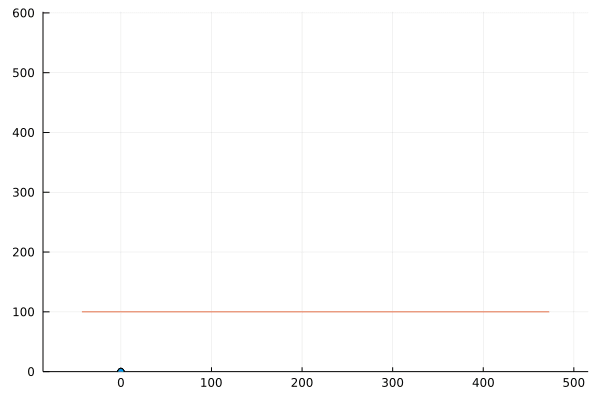

In [8]:
using Plots                              #c es la constente
function tiroparabolico(c,xi,vi,n,r)     #xi es la posicion inicial
    max=0                                #vi es la velocidad inicial
    tmax = 2*vi*sin(π/2-π/12)/9.81       #n es es numero de tiros
    py=[]                                #r es un parametro para alentar o acelerar el gif
    px=[]
    for i ∈ 1:n
        xtemp=[]
        ytemp=[]
        vx=vi*cos(((π/2-π/6)/n)*i+pi/12)
        vy=vi*sin(((π/2-π/6)/n)*i+pi/12)
        d=vi^2*sin(2*(((π/2-π/6)/n)*i+pi/12))/9.81
        if d > max
            max=d
        end
        for t ∈ 0:ceil(tmax)*r    
            x_t=vx*(t/r)+xi
            y_t=-(9.81*(t/r)^2)/2+vy*(t/r)
            push!(xtemp,x_t)
            push!(ytemp,y_t)
        end
        append!(px,[xtemp])
        append!(py,[ytemp])
    end
   @gif for i2 ∈ 1:Int64(ceil(tmax)*r)
        for t2 in 1:n
            p1=[[px[Int64(i)][Int64(j)] for j in 1:i2] for i in 1:n]
            p2=[[py[Int64(i)][Int64(j)] for j in 1:i2] for i in 1:n]
            for o in 1:t2
                if o==1                    
                    plot(p1[o],p2[o],color=o,label="") 
                    plot!([xi-(max-xi)/10,max+(max-xi)/10],[c,c],xlim=(xi-2*(max-xi)/10,max+2*(max-xi)/10),ylim=(0,max+4*(max-xi)/10),label="")
                end
                plot!(p1[o],p2[o],color=o,label="")
                scatter!([p1[o][i2]],[p2[o][i2]],color=o,label="")
            end
            
        end
    end
    
end

#Lo hice un poco diferente a los solicitado ya que no hice el ejercicio del tiro parabolico en la tarea pasada
#pero creo que esta funcion cumple con lo requerido

tiroparabolico(100,0,65,17,4)    

[4]**(fácil)** Haz una función que dado un centro y un radio grafique un círculo utilizando $n = 100$ puntos y relleno de color $color = RGB(1,0,0)$. Utiliza esta función para graficar círculos en los vértices de una red triangular (que se vean unos mil círculos). Los radios pueden ser como quieras (mismo radio, aleatorios, alguna función que se te ocurra). 

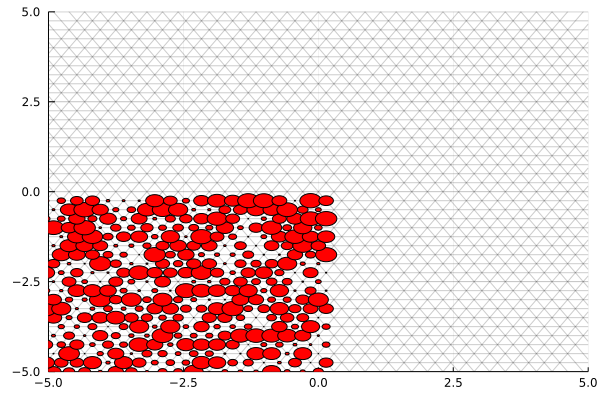

In [9]:
function graf_circulo(c,r,color=RGB(1,0,0))
    px=[]
    py=[]
    for θ in 0:2*pi/100:2*pi
        x=c[1]+r*cos(θ)
        y=c[2]+r*sin(θ)
        push!(px,x)
        push!(py,y)
    end
    push!(px,c[1]+r)
    push!(py,c[2])
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

# graf_circulo([2,3],3,RGB(1,0,0))

function redtriangular(h,c)
for l in 1:2
     for i in 1:c
        if i==1 && l==1
            plot(x->(tan(pi/3)*x-c*h/2),show=:ijulia,color=:black,alpha=0.2,ylim=(-5,5),xlim=(-5,5),label="")
            plot!(x->(tan(pi/3)*x*((-1)^l)-c*h/2),show=:ijulia,color=:black,alpha=0.2,label="")
        end
            plot!(x->(tan(pi/3)*x*((-1)^l)-c*h/2+i*h),show=:ijulia,color=:black,alpha=0.2,label="")
        if l==1
                plot!(x->i*h-c*h/2-1*h,show=:ijulia,color=:black,alpha=0.2,label="")
                plot!(x->i*h-c*h/2-1*h+h/2,show=:ijulia,color=:black,alpha=0.2,label="")
        end
    end
end
    
end

redtriangular(0.5,50)

for h in 1:20
    for k in 1:20
    if mod(h,2)==1
        graf_circulo([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3)),-10*0.5+h*0.25-0.25],0.2*rand())
    end
    if mod(h,2)==0
        graf_circulo([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3))+(0.5/tan(pi/3))/2,-10*0.5+h*0.25-0.25],0.2*rand())
    end
    end
end
#Con estos datos se forman 400 circulos, es posible hacer mas circulos simplemente cambiando el limite de los for
#pero se vuelve mas tardado de lo necesario, espero que con 400 baste la demostracion.


[5] **(dificultad media)** Haz otra función que grafique elpises, dado el centro, el semi eje mayor, semi eje menor y el ángulo de rotación. Igual que antes, utilizando $n = 100$ puntos, y relleno de $color = RGB(1,0,0)$. Esta vez utilizalo para dibujar elpises sobre los vértices de una red  triangular, orientando las elipses aleatoriamente entre $0, \pi/3$ y $2\pi/3$. Los semi-ejes elígelos que sean siempre iguales, pero varía el color con alguna función que se te ocurra. 

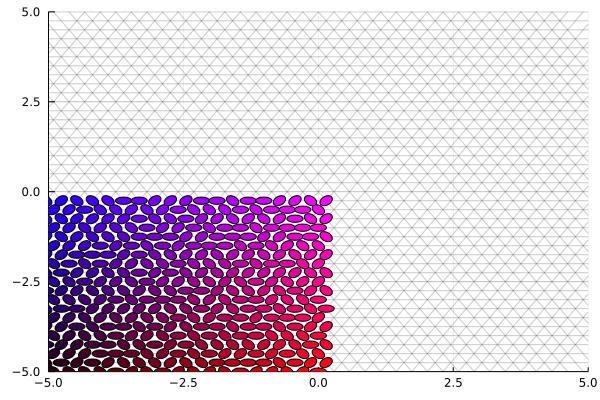

In [10]:
using LinearAlgebra

function graf_elipse(c,r1,r2,θ,color=RGB(1,0,0))
    px=[]
    py=[]
    xc=0
    yc=0
     for b in 0:2*pi/100:2*pi
        x=[(r2)*cos(b),(r1)*sin(b)]
        rot=[cos(θ) -sin(θ);
             sin(θ) cos(θ)]
        xr=rot*x
        if b == 0
            xc=xr[1]
            yc=xr[2]
        end
        push!(px,xr[1])
        push!(py,xr[2])
    end
    push!(px,xc)
    push!(py,yc)
    px=c[1] .+ px
    py=c[2] .+ py
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

# graf_elipse([1,1],1,2,pi/3)


redtriangular(0.5,50)

for h in 1:20
    for k in 1:20
    if mod(h,2)==1
        graf_elipse([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3)),-10*0.5+h*0.25-0.25],0.10,0.15,rand([0,pi/3,2*pi/3]),RGB(k/20,0,h/20))
    end
    if mod(h,2)==0
        graf_elipse([-20*(0.5/tan(pi/3))+k*(0.5/tan(pi/3))+(0.5/tan(pi/3))/2,-10*0.5+h*0.25-0.25],0.10,0.15,rand([0,pi/3,2*pi/3]),RGB(k/20,0,h/20))
    end
    end
end
#Con estos datos se forman 400 elipses, es posible hacer mas circulos simplemente cambiando el limite de los for y
#el veinte de la funcion de los colores tiene que coincidir con el nuevo limite, pero al hacer esto
#se vuelve mas tardado de lo necesario, espero que con 400 baste la demostracion.

    

[6] **(dificultad media)** Utilizando la técnica de graficar sobre imágenes (como con la curva de Koch en los videos), haz el fractal del triángulo de Sierpinski y un fractal de árbol o de helecho. Para ambos puedes usar una función iterativa. Sólo toma en cuenta que no debes de exagerar en el número de pasos, 7-10 pasos es suficiente para ver un fractal bonito. 

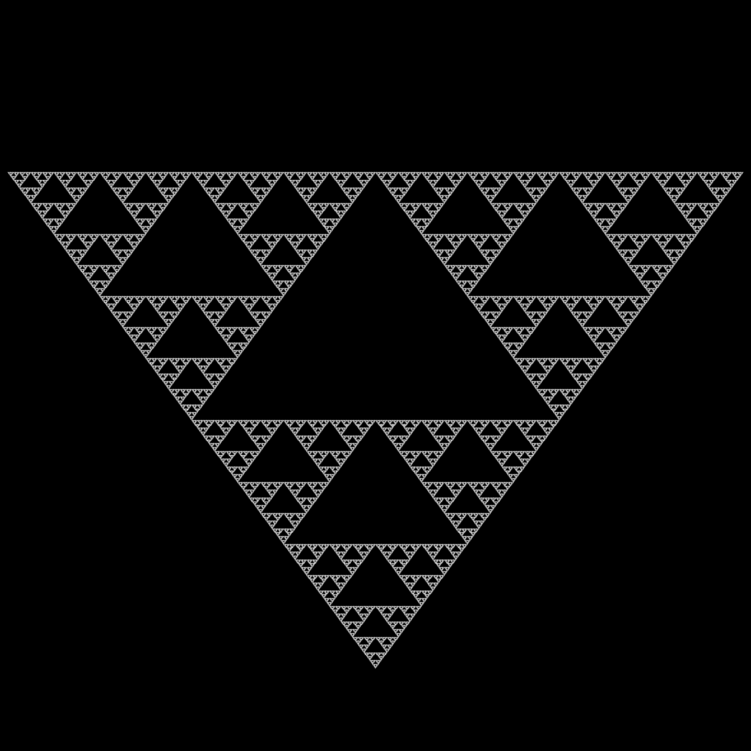

In [11]:
using Images, ImageView, ImageIO, LinearAlgebra

imagen=[RGB(0,0,0) for i in 1:1500, j in 1:1500]

function dibuja_punto_en_imagen(x,y, cajax, cajay, Imagen)
    w, h = size(imagen)
    pixel_x = ceil(Int, w*(x-cajax[1])/(cajax[2]-cajax[1]))
    pixel_y = ceil(Int, h*(y-cajay[1])/(cajay[2]-cajay[1]))
    Imagen[pixel_y, pixel_x] = RGB(1,1,1)
end

function dividirtriangulo(vertices)
    x=vertices[1]+(vertices[2]-vertices[1])/2
    y=vertices[2]+(vertices[3]-vertices[2])/2
    z=vertices[1]+(vertices[3]-vertices[1])/2
    
    t1=[vertices[1],x,z]
    t2=[x,vertices[2],y]
    t3=[z,y,vertices[3]]
    
    return [t1,t2,t3]
end

function sierpinski(triangulos)
    temp=[]
    for i in 1:length(triangulos)
        temp=append!(temp,dividirtriangulo(triangulos[i]))
    end
    append!(triangulos,temp)
end

triangulos=[[[0,0],[1/2, sqrt(3)/2],[1,0]]]

for l in 1:10
    sierpinski(triangulos)
end

for j in 1:length(triangulos)
    for k in 1:3
        dibuja_punto_en_imagen(triangulos[j][k][1],triangulos[j][k][2],[-0.01,1.01],[-0.3,1.01],imagen)
    end
end

imagen



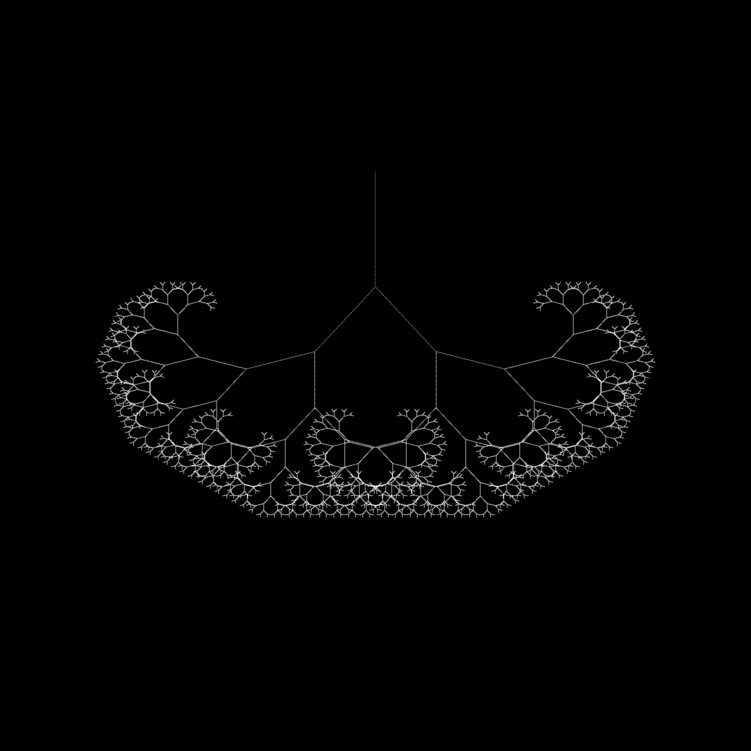

In [12]:
imagen2=[RGB(0,0,0) for i in 1:1500, j in 1:1500]

function dibuja_punto_en_imagen(x,y, cajax, cajay, Imagen)
    w, h = size(imagen2)
    pixel_x = ceil(Int, w*(x-cajax[1])/(cajax[2]-cajax[1]))
    pixel_y = ceil(Int, h*(y-cajay[1])/(cajay[2]-cajay[1]))
    Imagen[pixel_y, pixel_x] = RGB(1,1,1)
end

function dibujarecta(a,b)
    for i in 0:0.01:1
        punto=a+(b-a)*i
        dibuja_punto_en_imagen(punto[1],punto[2],[-0.01,1.01],[-0.3,1.01],imagen2)
    end
end

function dividirrama(segmento,θ,r)
    rot1=[cos(θ) -sin(θ);
        sin(θ)  cos(θ)]
    rot2=[cos(-θ) -sin(-θ);
        sin(-θ)  cos(-θ)]
    x=(rot1*(segmento[2]-segmento[1]))*r
    y=(rot2*(segmento[2]-segmento[1]))*r
    rama1=[segmento[2],segmento[2]+x]
    rama2=[segmento[2],segmento[2]+y]
    
    return [rama1,rama2]
end

ramas=[[[1/2,0],[1/2,0.2]]]

function arbol(ramas,θ,r)
    temp=[]
    for i in 1:length(ramas)
        temp=append!(temp,dividirrama(ramas[i],θ,r))
    end
    append!(ramas,temp)
end

    for j in 1:10
        arbol(ramas,pi/5,0.7)
    end

    for n in 1:length(ramas)
        dibujarecta(ramas[n][1],ramas[n][2])
    end

    imagen2
        

[7-8] **(difícil)** Partícula en una caja cuadrada

(i) Haz una función que dadas la posición y velocidad de una partícula en 2D, el lado de un cuadrado, el centro de ese cuadrado y el ángulo de inclinación del cuadrado, encuentre dónde colisionará primero la partícula con el cuadrado (si no colisiona con ninguna cara, entonces regresa (Inf, Inf)). 

(ii) Haz otra función que "refleje" la velocidad de la partícula al colicionar con la cara del cuadrado siguiendo la ley de Snell de la colisión.  

(iii) Finalmente haz una animación de una partícula rebotando dentro de una caja cuadrada de lado 1 rotada un ángulo $\pi/5$, con velocidad inicial $(1,0)$ y posición inicial $(0,0)$. 

Nota: (como es bastante largo este problema, cuenta como 2). 

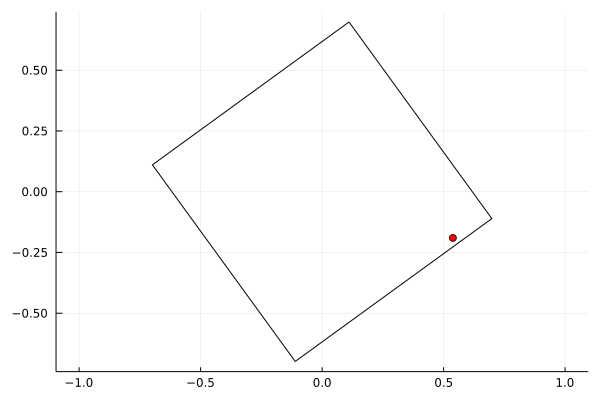

┌ Info: Saved animation to 
│   fn = C:\Users\coswa\Desktop\Fisica computacional\tmp.gif
└ @ Plots C:\Users\coswa\.julia\packages\Plots\CoJwR\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\coswa\\Desktop\\Fisica computacional\\tmp.gif")
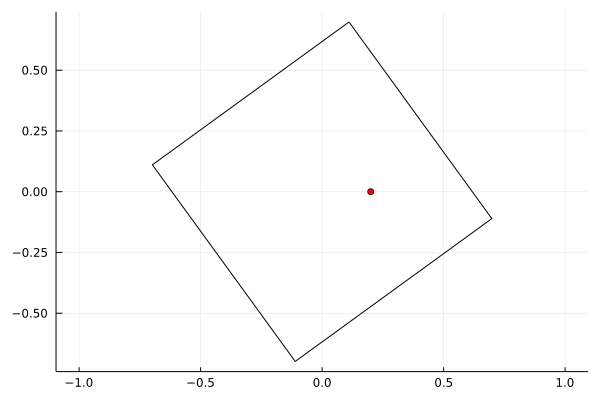

In [17]:
using LinearAlgebra
using Plots
function cuadrado(l,c,θ)
    verticesr=[]
    verticesrx=[]
    verticesry=[]
    vertices=[[l/2,l/2],[-l/2,l/2],[-l/2,-l/2],[l/2,-l/2]]
    rot=[cos(θ) -sin(θ);
         sin(θ)  cos(θ)]
    for i in 1:4
        push!(verticesrx,((rot*vertices[i])+c)[1])
        push!(verticesry,((rot*vertices[i])+c)[2])
    end
    plot(verticesrx,verticesry,ratio=1,seriestype=[:shape,],fillcolor=false,label="")
    return [[verticesrx[i],verticesry[i]] for i in 1:4]
end

function pelota(l,c,θ,v0,x0,h)
    x=x0[1]
    y=x0[2]
    vx=v0[1]
    vy=v0[2]
    
  @gif for t in 1:0.2:1000
        puntos=cuadrado(l,c,θ)
        x=x+vx*0.2
        y=y+vy*0.2
        p=[x,y]
        dis=[norm(p-puntos[1]),norm(p-puntos[2]),norm(p-puntos[3]),norm(p-puntos[4]),norm(p-puntos[1])]
        angulo=[]
        ang=[]
        for j in 1:3
            ang=append!(ang,acos(dot(puntos[j+1]-p,puntos[j]-p)/(norm(puntos[j+1]-p)*norm(puntos[j]-p))))
        end
        ang=append!(ang,acos(dot(puntos[1]-p,puntos[4]-p)/(norm(puntos[1]-p)*norm(puntos[4]-p))))
        for i in 1:3
            angulo=append!(angulo,acos(dot(puntos[i+1]-puntos[i],[vx,vy])/(norm(puntos[i+1]-puntos[i])*norm([vx,vy]))))
        end
        angulo=append!(angulo,acos(dot(puntos[1]-puntos[4],[vx,vy])/(norm(puntos[1]-puntos[4])*norm([vx,vy]))))
        for k in 1:4
            if (sin(ang[k])*dis[k+1]*dis[k])/l <= h
                
                rot=[cos(2*angulo[k]) -sin(2*angulo[k]); sin(2*angulo[k])  cos(2*angulo[k])]
                
                vn=(rot*[vx,vy])
                
                vx=vn[1]
                vy=vn[2]
                
            end
        end
        scatter!([x],[y],show=:ijulia,color=RGB(1,0,0),label="")
    end

end
pelota(1,[0,0],pi/5,[1,0],[0,0],0.1)
   

## Objetos y gráficas

Antes de comenzar debes asegurarte que tus objetos Segmento y Polígono están definidos adecuadamente y conviene de una vez que los pongas como parte de un objeto abstracto llamado "Figura_Geométrica". 

[9] **(fácil)** Haz un objeto "LineaPoligonal" que sea parte de "Figura_Geométrica" que sea similar al objeto polígono, pero donde no existe un área y el perímetro es simplemente la suma de los segmentos que contenga. Agrega a * y + los métodos similares a los que agregaste en los problemas 14 y 15 de la tarea pasada. En el caso de la suma, tanto Polígono+LineaPoligonal, como Segmento+LineaPoligonal deben dar como resultado una LineaPoligonal. Además modifica los métodos de + entre polígonos, entre segmentos, segmento+polígono y polígono+segmento, de tal forma que en todos los casos se obtenga una LineaPoligonal. 

In [1]:
using LinearAlgebra
function area_poligono(vertices::Array{Array{Float64,1},1})
    numeroLados = length(vertices)
    areafinal = 1/2 * abs(sum(*(vertices[i+1][1] + vertices[i][1], vertices[i+1][2] - vertices[i][2]) for i ∈ 1:(numeroLados-1)))
    areafinal += 1/2 * abs(sum(*(vertices[1][1] + vertices[numeroLados][1], vertices[1][2] - vertices[numeroLados][2])))
    return areafinal
end

abstract type Figura_Geometrica end

mutable struct Segmento <: Figura_Geometrica
    inicio::Array{Float64}
    final::Array{Float64}
    longitud::Real
end

function Segmento(i::Array{Float64},f::Array{Float64})
    return Segmento(i,f,norm(f-i))
end

mutable struct Poligono <: Figura_Geometrica
    vertices::Array{Array{Float64, 1}, 1}
    segmentos::Array{Segmento}
    perimetro::Real
    area::Real
end

function Poligono(v::Vector{Vector{Float64}})
    lados=[]
    for i in 1:length(v)-1
        push!(lados,Segmento(v[i],v[i+1]))
    end
    push!(lados,Segmento(v[length(v)],v[1]))
    
    peri=sum([norm([lados[j].final-lados[j].inicio for j in 1:length(v)])])
    a=area_poligono(v)
    return Poligono(v,lados,peri,a)
end
    
    
mutable struct LineaPoligonal <: Figura_Geometrica
    vertices::Array{Array{Float64, 1}, 1}
    segmentos::Array{Segmento}
    perimetro::Real
end

function LineaPoligonal(v::Vector{Vector{Float64}})
    lados=[]
    for i in 1:length(v)-1
        push!(lados,Segmento(v[i],v[i+1]))
    end
    peri=sum([norm([lados[j].final-lados[j].inicio for j in 1:length(v)-1])])
    return LineaPoligonal(v,lados,peri)
end
    
import Base.+
function +(p::Poligono,l::LineaPoligonal)
    v=p.vertices ∪ l.vertices
        return LineaPoligonal(v)
end    

function +(s::Segmento,l::LineaPoligonal)
    push!(l.vertices,s.inicio)
    push!(l.vertices,s.final)
    return LineaPoligonal(l.vertices)
end
function +(l::LineaPoligonal,s::Segmento)
    push!(l.vertices,s.inicio)
    push!(l.vertices,s.final)
    return LineaPoligonal(l.vertices)
end
    
function +(p1::Poligono,p2::Poligono)
        v=p1.vertices ∪ p2.vertices
return LineaPoligonal(v)
end            
function +(s1::Segmento,s2::Segmento)
        return LineaPoligonal([s1.inicio,s1.final,s2.inicio,s2.final])
end

function +(s::Segmento,p::Poligono)
        return LineaPoligonal([s.inicio,s.final] ∪ p.vertices)
end
            
function +(p::Poligono,s::Segmento)
        return LineaPoligonal([s.inicio,s.final] ∪ p.vertices)
end




+ (generic function with 197 methods)

[10] **(fácil)** Importa las funciones plot y plot! para agregarles métodos para graficar tus objetos dentro del objeto abstracto Figura_Geométrica.  Asegúrate de poder agregar colores, ancho de línea, si lleva relleno o no el polígono, etc... pero que todas esas características estén predefinidas por el default de Plots. Asegúrate que tanto para la línea poligonal, como para el segmento, se pueda graficar tanto en 2 como en 3 dimensiones. 

Prueba esto graficando varias figuras geométricas, comenzando con un par de segmentos y su suma, dos polígonos y su suma, dos líneas poligonales y su suma, etc...

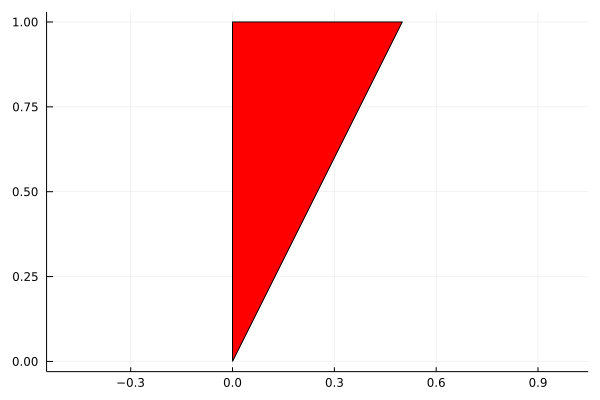

In [23]:
import Plots.plot, Plots.plot!

function plot(f::Figura_Geometrica,c=:red,r=1)
    if f isa Poligono
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        push!(vx,f.vertices[1][1])
        push!(vy,f.vertices[1][2])
        return plot(vx,vy,seriestype=[:shape,],color=c,ratio=r,label="")
    elseif f isa Segmento
        x=[f.inicio[1],f.final[1]]
        y=[f.inicio[2],f.final[2]]
        return plot(x,y,color=c,ratio=r,label="")
    elseif f isa LineaPoligonal
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        return plot(vx,vy,color=c,ratio=r,label="")
    end
end

function plot!(f::Figura_Geometrica,c=:red,r=1)
    if f isa Poligono
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        push!(vx,f.vertices[1][1])
        push!(vy,f.vertices[1][2])
        return plot!(vx,vy,seriestype=[:shape,],color=c,ratio=r,label="")
    elseif f isa Segmento
        x=[f.inicio[1],f.final[1]]
        y=[f.inicio[2],f.final[2]]
        return plot!(x,y,color=c,ratio=r,label="")
    elseif f isa LineaPoligonal
        vx=[f.vertices[i][1] for i in 1:length(f.vertices)]
        vy=[f.vertices[i][2] for i in 1:length(f.vertices)]
        return plot!(vx,vy,color=c,ratio=r,label="")
    end
end
function plot(p::Persona)
    plot(p.torzo)
    plot!(p.muslo_izq)
    plot!(p.muslo_der)
    plot!(p.antebrazo_izq)
    plot!(p.antebrazo_der)
    plot!(p.pierna_izq)
    plot!(p.pierna_der)
    plot!(p.brazo_izq)
    plot!(p.brazo_der)
    graf_circulo([p.x1,p.x2],p.cabeza,p.color)
end
function plot!(p::Persona)
    plot!(p.torzo)
    plot!(p.muslo_izq)
    plot!(p.muslo_der)
    plot!(p.antebrazo_izq)
    plot!(p.antebrazo_der)
    plot!(p.pierna_izq)
    plot!(p.pierna_der)
    plot!(p.brazo_izq)
    plot!(p.brazo_der)
    graf_circulo([p.x1,p.x2],p.cabeza,p.color)
end

plot(Poligono([[0,0],[0,1],[1/2,1]]))


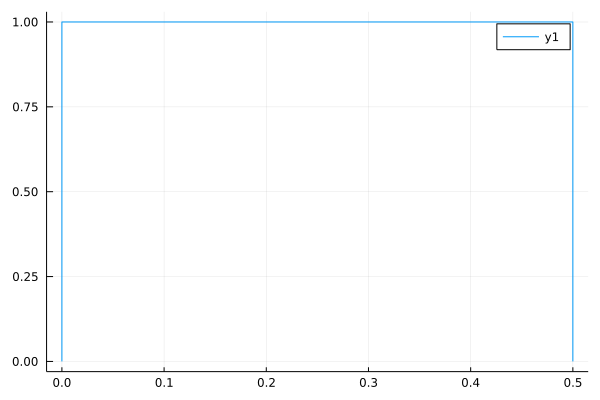

In [5]:
plot(Poligono([[0,0],[0,1],[1/2,1]])+Poligono([[0,0],[1/2,0],[1/2,1]]))

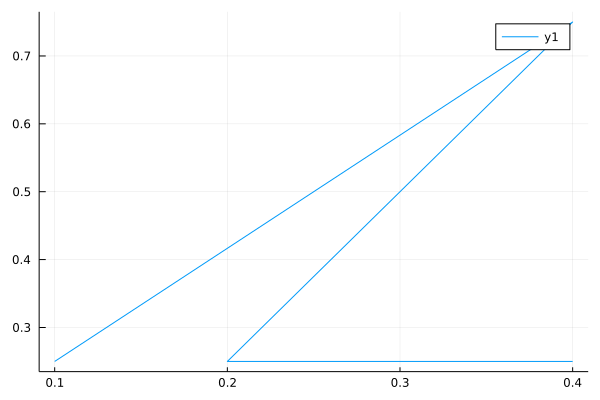

In [27]:
plot(Segmento([0.1,0.25],[0.4,0.75])+Segmento([0.2,0.25],[0.4,0.25]))

[11]**(dificultad media)** Haz un objeto "Persona" que incluya brazo_izq, brazo_der, antebrazo_izq, antebrazo_der, torzo, cabeza, muslo_izq, muslo_der, pierna_izq, pierna_der, y color como características del objeto. Todas excepto cabeza y color son Segmentos. Cabeza es un número real que corresponde al radio y color es la unión de un RGB y un símbolo. Después haz una función que dada la altura, la posición, dimensión (2 o 3 dimensional) y el color produzca una Persona con una proporción adecuada, centro de torzo en la posición dada y uniendo adecuadamente los segmentos (con una postura "realista"). Finalmente agrega un método a plot y plot! para que dibuje una persona en el caso 2D y en el caso 3D. 

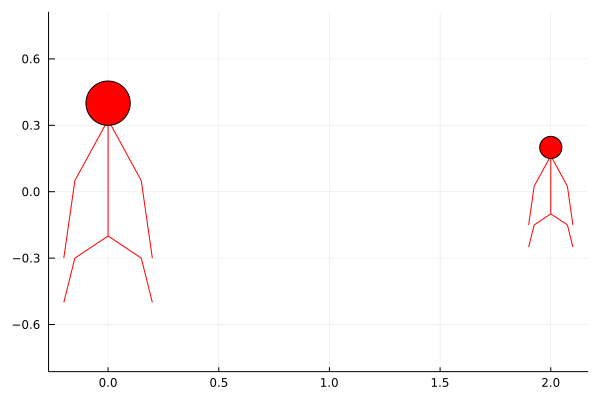

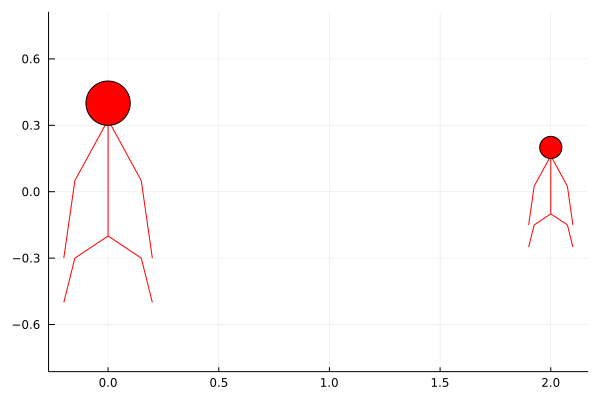

In [16]:
mutable struct Persona
    torzo::Segmento
    muslo_izq::Segmento
    muslo_der::Segmento
    pierna_izq::Segmento
    pierna_der::Segmento
    brazo_izq::Segmento
    brazo_der::Segmento
    antebrazo_izq::Segmento
    antebrazo_der::Segmento
    cabeza::Real
    x1::Real
    x2::Real
    color
end

function graf_circulo(c,r,color=RGB(1,0,0))
    px=[]
    py=[]
    for θ in 0:2*pi/100:2*pi
        x=c[1]+r*cos(θ)
        y=c[2]+r*sin(θ)
        push!(px,x)
        push!(py,y)
    end
    push!(px,c[1]+r)
    push!(py,c[2])
    plot!(px,py,c=color,show=:ijulia, seriestype=[:shape,],label="")
end

function creaPersona(h::Real, x::Vector{Float64}, d::Int8,c)
    if d == 2
        torzo = Segmento([x[1], x[2] - 4/20 * h], [x[1], x[2] + 6/20 * h])
        muslo_izq = Segmento([x[1], x[2] - 4/20 * h], [x[1] - 3/20 * h, x[2] - 6/20 * h])
        muslo_der = Segmento([x[1], x[2] - 4/20 * h], [x[1] + 3/20 * h, x[2] - 6/20 * h])
        pierna_izq = Segmento([x[1] - 3/20 * h, x[2] - 6/20 * h], [x[1] - 4/20 * h, x[2] - 10/20 * h])
        pierna_der = Segmento([x[1] + 3/20 * h, x[2] - 6/20 * h], [x[1] + 4/20 * h, x[2] - 10/20 * h])
        brazo_izq = Segmento([x[1], x[2] + 6.5/20 * h], [x[1] - 3/20 * h, x[2] + 1/20 * h])
        brazo_der = Segmento([x[1], x[2] + 6.5/20 * h], [x[1] + 3/20 * h, x[2] + 1/20 * h])
        antebrazo_izq = Segmento([x[1] - 3/20 * h, x[2] + 1/20 * h], [x[1] - 4/20 * h, x[2] - 6/20 * h])
        antebrazo_der = Segmento([x[1] + 3/20 * h, x[2] + 1/20 * h], [x[1] + 4/20 * h, x[2] - 6/20 * h])
        cabeza = 2/20*h
        x1=x[1]
        x2=x[2]+8/20*h
        color=c

        return Persona(torzo,muslo_izq,muslo_der,pierna_izq,pierna_der,brazo_izq,brazo_der,antebrazo_izq,antebrazo_der,cabeza,x1,x2,color)
    end
    if d == 3
        torzo = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1], x[2] + 6/20 * h,x[3]])
        muslo_izq = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1] - 3/20 * h, x[2] - 6/20 * h,x[3]])
        muslo_der = Segmento([x[1], x[2] - 4/20 * h,x[3]], [x[1] + 3/20 * h, x[2] - 6/20 * h,x[3]])
        pierna_izq = Segmento([x[1] - 3/20 * h, x[2] - 6/20 * h,x[3]], [x[1] - 4/20 * h, x[2] - 10/20 * h,x[3]])
        pierna_der = Segmento([x[1] + 3/20 * h, x[2] - 6/20 * h,x[3]], [x[1] + 4/20 * h, x[2] - 10/20 * h,x[3]])
        brazo_izq = Segmento([x[1], x[2] + 6.5/20 * h,x[3]], [x[1] - 3/20 * h, x[2] + 1/20 * h,x[3]])
        brazo_der = Segmento([x[1], x[2] + 6.5/20 * h,x[3]], [x[1] + 3/20 * h, x[2] + 1/20 * h],x[3])
        antebrazo_izq = Segmento([x[1] - 3/20 * h, x[2] + 1/20 * h,x[3]], [x[1] - 4/20 * h, x[2] - 6/20 * h,x[3]])
        antebrazo_der = Segmento([x[1] + 3/20 * h, x[2] + 1/20 * h,x[3]], [x[1] + 4/20 * h, x[2] - 6/20 * h,x[3]])
        cabeza = 2/20*h
        x1=x[1]
        x2=x[2]+8/20*h
        color=c

        return Persona(torzo,muslo_izq,muslo_der,pierna_izq,pierna_der,brazo_izq,brazo_der,antebrazo_izq,antebrazo_der,cabeza,x1,x2,color)
    
    
    end
end
plot((creaPersona(1,[0.,0.,1.],Int8(3),:red)))
plot!((creaPersona(0.5,[2.,0.,0.],Int8(3),:red)))


[12] **(muy difícil)** Haz una función que dada una dirección de la forma $(x,y,0)$, una rapidez y un tiempo, haga una animación de una Persona de altura $h = 1$ caminando sobre esa recta ese tiempo (el tamaño de los pasos debe ser $h/2$). Trata que la animación sea lo más realista posible (observa qué es lo que haces al caminar, como mueves tus piernas y brazos).  

Prueba tu función poniendo a caminar a varias personas a la vez. 

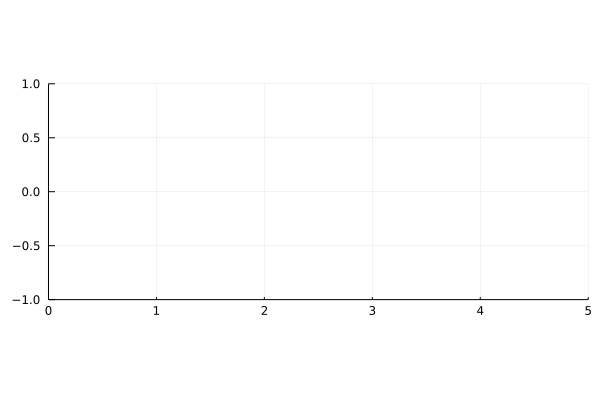

┌ Info: Saved animation to 
│   fn = C:\Users\coswa\Desktop\Fisica computacional\tmp.gif
└ @ Plots C:\Users\coswa\.julia\packages\Plots\CoJwR\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\coswa\\Desktop\\Fisica computacional\\tmp.gif")
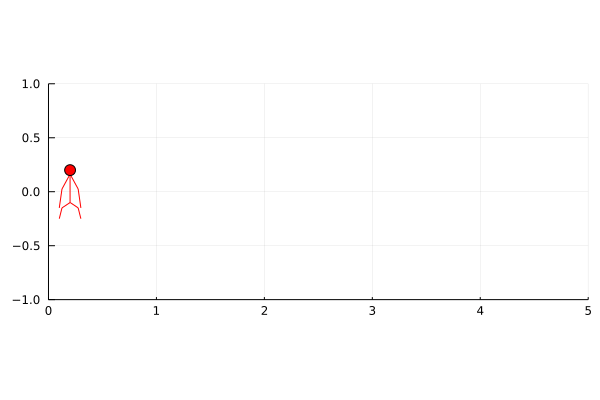

In [32]:
@gif for t in 1:30
    plot(xlim=(0,5), ylim=(-1,1))
    plot!((creaPersona(0.5,[t*.2,0.,0.],Int8(3),:red)))
end

## Imágenes

[13] **(dificultad media)** Convoluciones. Una de las ventajas de trabajar con imágenes en Julia (o cualquier lenguaje de programación), es que uno puede hacer funciones que apliquen automáticamente algún efecto que se quiera. Algunas de las transformaciones más útiles son algo que se conoce como convoluciones. Para hacer una convolución primero necesitamos generar una función para mezclar colores de un cuadrado de $(2n+1)\times (2n+1)$ pixeles (típicamente elegimos $n = 1$), que se le conoce como Kernel. Por ejemplo, digamos que queremos hacer un kernel que promedie colores. Para cada pixel (que es un objeto RGB), obtenemos la cantidad de rojo, verde y azul que tiene usando pixel[i,j].r, pixel[i,j].g y pixel[i,j].b, luego, en la nueva imágen tendremos que pixel_nueva_imagen[i,j] = RGB((pixel[i,j].r+pixel[i,j+1].r+pixel[i,j-1].r+...)/9, (pixel[i,j].g+pixel[i,j+1].g+pixel[i,j-1].g+...)/9, (pixel[i,j].b+pixel[i,j+1].b+pixel[i,j-1].b+...)/9). 

Aquí hay que notar que cuando i o j corresponden a la frontera, no existirán algunos de los vecinos. En ese caso se puede sustituir el vecino por un color fijo, por ejemplo negro o blanco. 

Haz una función para obtener la convolución usando la regla del promedio. Pruébalo con varias fotografías, ¿qué notas? 

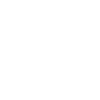

In [28]:
using Images, ImageView, ImageIO
function prom(x)  #Imagen
    
    y = []
    for i in 1:(size(x)[1])
        for j in 1:(size(x)[2])
            try
                push!(y, [(Float64(x[i,j].r) + Float64(x[i,j+1].r) + Float64(x[i,j-1].r) + Float64(x[i-1,j].r) + Float64(x[i+1,j].r) + Float64(x[i-1,j-1].r) + Float64(x[i-1,j+1].r) + Float64(x[i+1,j-1].r) + Float64(x[i+1,j+1].r)) / 9.0, (Float64(x[i,j].g) + Float64(x[i,j+1].g) + Float64(x[i,j-1].g) + Float64(x[i-1,j].g) + Float64(x[i+1,j].g) + Float64(x[i-1,j-1].g) + Float64(x[i-1,j+1].g) + Float64(x[i+1,j-1].g) + Float64(x[i+1,j+1].g)) / 9.0, (Float64(x[i,j].b) + Float64(x[i,j+1].b) + Float64(x[i,j-1].b) + Float64(x[i-1,j].b) + Float64(x[i+1,j].b) + Float64(x[i-1,j-1].b) + Float64(x[i-1,j+1].b) + Float64(x[i+1,j-1].b) + Float64(x[i+1,j+1].b)) / 9.0])
            catch
            end 
        end
    end
    y
    
    z = []
    for i in 0:((size(x)[1]-2)-1)
        push!(z, y[(((size(x)[2]-2)*i)+1):((size(x)[2]-2)*(i+1))])
    end
    z
    
    m(a,b) = z[a][b]
    v = [m(a,b) for a in 1:(size(x)[1]-2), b in 1:(size(x)[2]-2)]
    
    rgb(c) = RGB(c[1],c[2],c[3])
    
    rgb.(v)
    
end

A = [RGB(1,1,1) for x in 1:20, y in 1:20]

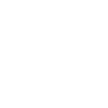

In [29]:
prom(A)

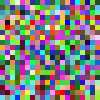

In [30]:
B = [rand(RGB) for x in 1:20, y in 1:20]

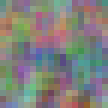

In [31]:
prom(B)

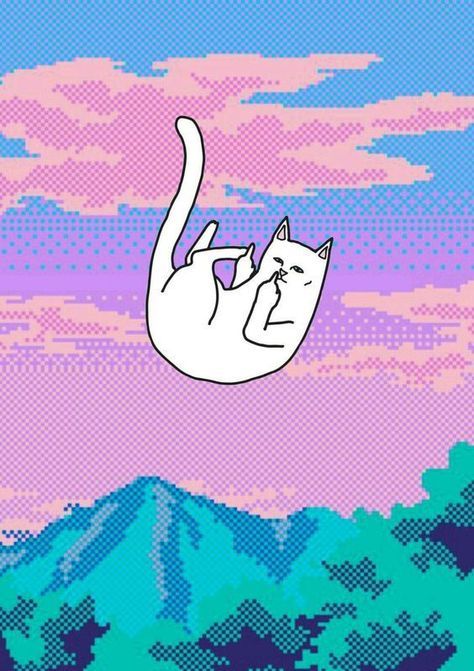

In [33]:
foto = load("gato.jpeg")

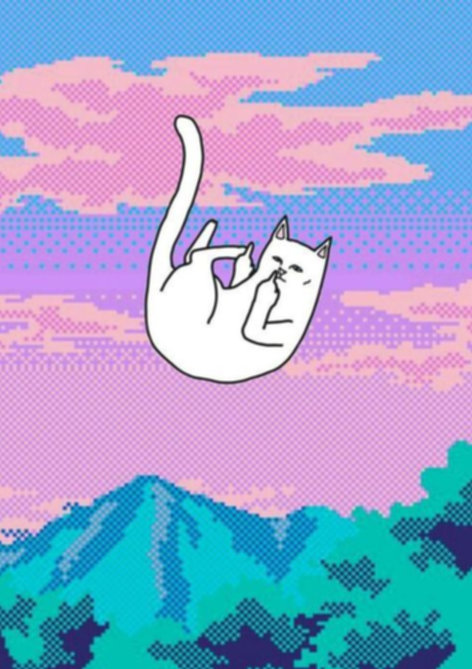

In [34]:
prom(foto)

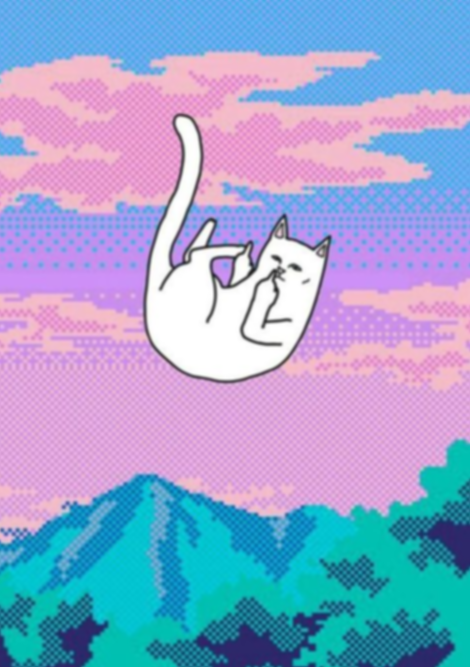

In [35]:
prom(prom(foto))

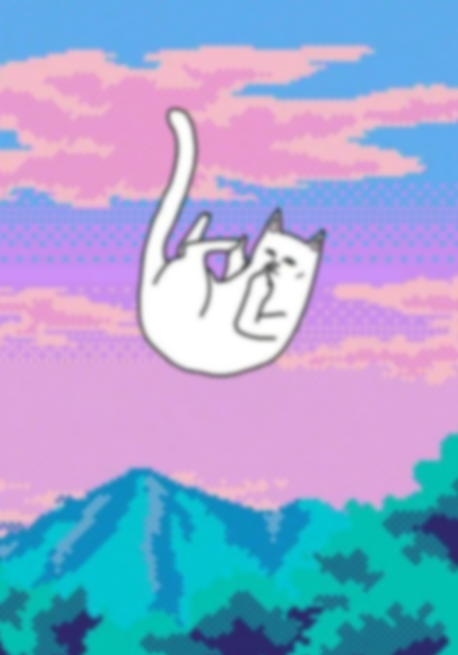

In [36]:
prom(prom(prom(prom(prom(prom(prom(prom(foto)))))))) 

[14] **(fácil)** Convoluciones-continuación. Ahora haz una función que dado un Kernel (una matriz de $(2n+1)\times (2n+1)$ que dice cual es el peso de cada pixel vecino y el mismo pixel involucrado a la hora de sumar (o restar) colores), que obtenga la imágen convolucionada. 

prueba usando estos algunos de estos kernels: https://en.wikipedia.org/wiki/Kernel_(image_processing) sobre las imágenes de tu preferencia. 

**Nota:** En la lista de kernels de wikipedia vienen algunos donde pueden salir proporciones negativas de algún color. No tiene sentido $RGB(-1,0,0)$, así que la regla es: si algún color tiene más de 1, entonces se vuelve 1 y si tiene menos de 0, se vuelve 0. 

In [125]:
function convolucion(x, y) # matriz de 3x3, imagen
    
    z = []                                  ## Aquí se multiplica el kernel en cada pixel de la imagen y nos regresa
    for i in 1:size(y)[1]                    # un arreglo con los pixeles de la nueva foto, usando operaciones con elementos RGB
        for j in 1:size(y)[2]
            try
                push!(z, sum(x .* [y[i-1,j-1] y[i-1,j] y[i-1,j+1]; y[i,j-1] y[i,j] y[i,j+1]; y[i+1,j-1] y[i+1,j] y[i+1,j+1]]))
            catch
            end
        end
    end
    z

    w = []                                                             ## Usamos el mismo método que en ej. anterior
    for i in 0:((size(y)[1]-2)-1)
        push!(w, z[(((size(y)[2]-2)*i)+1):((size(y)[2]-2)*(i+1))])
    end
    w
    
    m(a,b) = w[a][b]
    v = [m(a,b) for a in 1:(size(y)[1]-2), b in 1:(size(y)[2]-2)]

end
    

convolucion (generic function with 1 method)

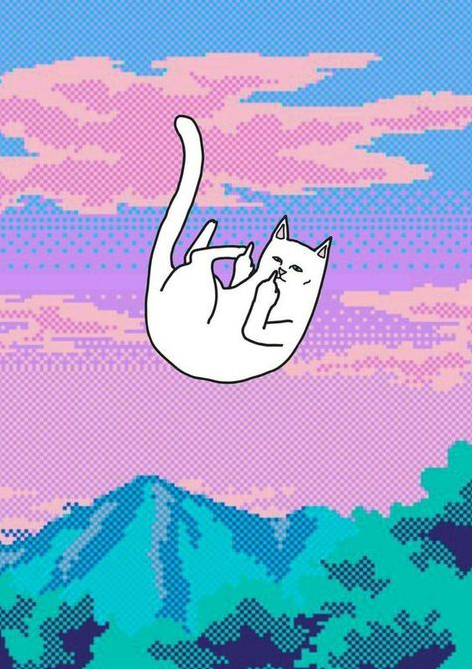

In [126]:
I = [0 0 0; 0 1 0; 0 0 0]
convolucion(I,foto)

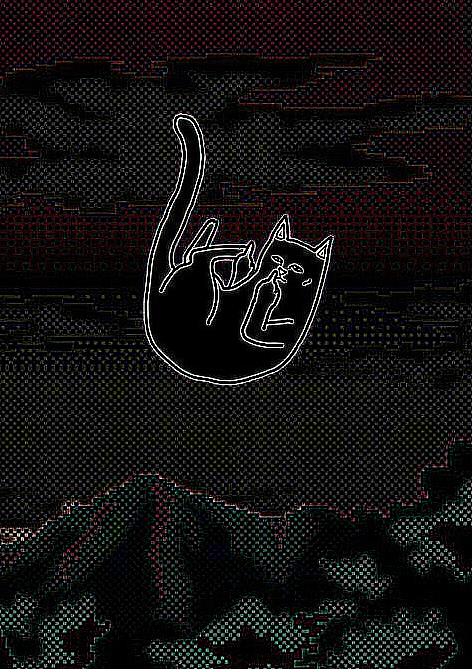

In [127]:
Bordes = [-1 -1 -1; -1 8 -1; -1 -1 -1]
convolucion(Bordes,foto)

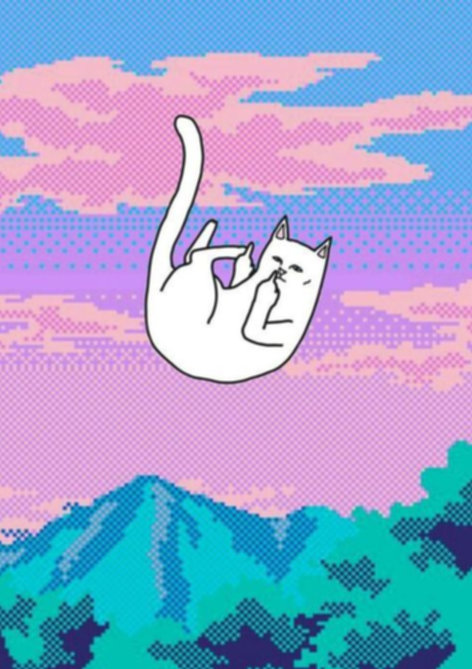

In [128]:
Desenfoque = [1 1 1; 1 1 1; 1 1 1] * 1/9
convolucion(Desenfoque,foto)

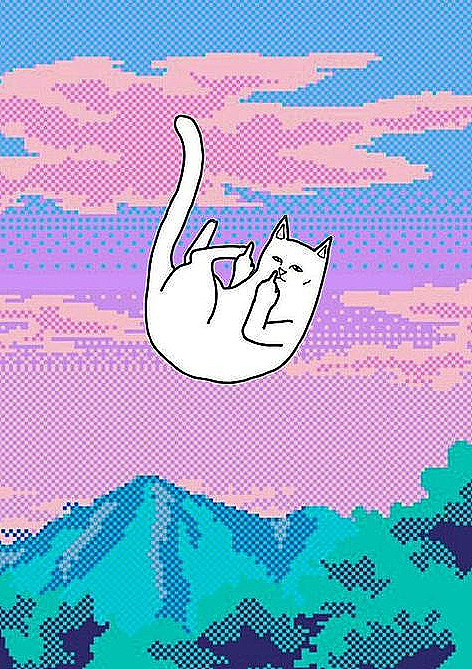

In [129]:
Enfocar = [0 -1 0; -1 5 -1; 0 -1 0]
convolucion(Enfocar,foto)


[15] **(difícil)** Dimensión fractal. Una idea "intuitiva" para calcular la dimensión fractal de una figura 2D, consiste en cuadricular la imagen que contiene la figura y después contar el número $N$ de cuadrados que contienen parte de la figura como función de la longitud $\epsilon$ del lado de los cuadrados. En ese caso, la dimensión fractal se puede calcular como: 

$$dim_f = lim_{\epsilon\rightarrow 0} \frac{N(\epsilon)}{log(1/\epsilon)}.$$

En las imágenes reales (fotografías o dibujos), no existe realmente nada fractal, todo tiene dimensión 2; sin embargo, muchos objetos son aproximadamente fractales, es decir, aunque para $lim_{\epsilon\rightarrow 0}$ la dimensión tiende a 2, para valores muy pequeños de $\epsilon$, $\frac{N(\epsilon)}{log(1/\epsilon)}$ parece tender a un número no entero. 

Haz una función que dada una imagen, una forma de elegir qué pixeles corresponden a una determinada figura (por ejemplo un rango de colores), calcule $\frac{N(\epsilon)}{log(1/\epsilon)}$. 

Finalmente, grafica  $\frac{N(\epsilon)}{log(1/\epsilon)}$ vs $\epsilon$ para las imágenes de fractales que produjiste en el problema 6. También haz la gráfica para la foto de algún rio o algo que creas que es fractal (y que no te cueste demasiado seleccionar los pixeles que corresponden a tu objeto (quizá haciendo previamente una (o varias) convolución(es) adecuada(s))). 

¿qué conclusiones sacas de esto?

**Nota que:** 

(i) La longitud de la imágen entre $\epsilon$ no es necesariamente un entero, lo que significa que podría haber cajas en 2 de las fronteras de la imagen que no sean cuadradas y que cuyos lados sean menores que $\epsilon$. Por lo tanto, conviene que el objeto al que quieres medir la dimensión fractal no toque (y esté suficientemente lejos de) las fronteras de la imagen.  

(ii) Si $\epsilon< 1px$ deberías empezar a ver que $\frac{N(\epsilon)}{log(1/\epsilon)}$ tiene un cambio de comportamiento y tiende a 2 (quizá un poco antes para el caso de una fotografía de un río, arbol, galaxia, etc...). 